# Set environment variables

In [1]:
%env DATA_ROOT=/fb-agios-acai-efs/dataset
%env GENERATE=/home/rishihazra/VisionLangaugeGrounding/alfred/gen

env: DATA_ROOT=/fb-agios-acai-efs/dataset
env: GENERATE=/home/rishihazra/VisionLangaugeGrounding/alfred/gen


# Loading Libraries

In [2]:
import os
import sys
sys.path.append(os.environ['DATA_ROOT'])
sys.path.append(os.environ['GENERATE'])
from utils.dataset_management_util import load_successes_from_disk, plot_dataset_stats, analyze_trajectories
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Sample Videos

In [3]:
from IPython.display import Video
video_path = os.path.join(os.environ['DATA_ROOT'], 'train/cool_and_slice_and_place/Bread-None-Microwave-8/trial_T20220914_090229_859807/video.mp4')
Video(video_path, embed=True)

In [4]:
#Potato-None-None-4/trial_T20220911_175038_115765
from IPython.display import Video
video_path = os.path.join(os.environ['DATA_ROOT'], 'train/slice_then_heat_then_clean/Tomato-None-None-17/trial_T20220913_184123_537769/video.mp4')
Video(video_path, embed=True)

# Analyzing Train Split

<Figure size 2160x2160 with 0 Axes>

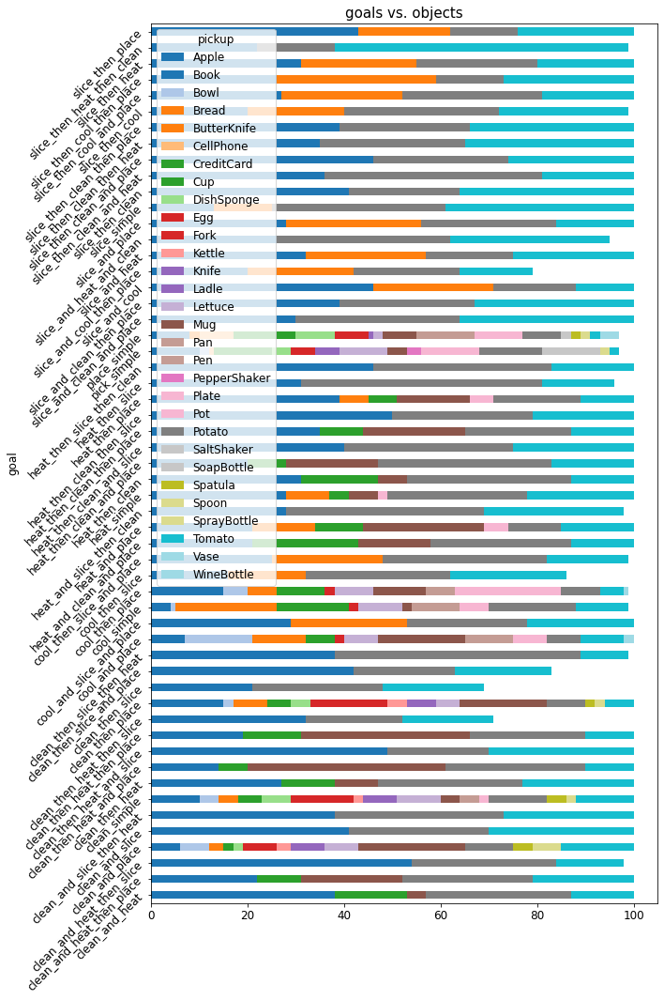

no movable objects used


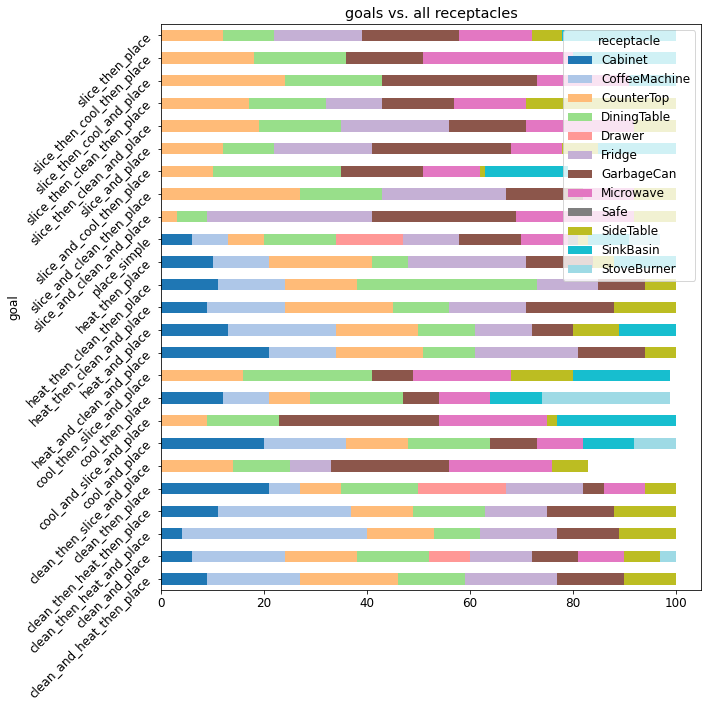

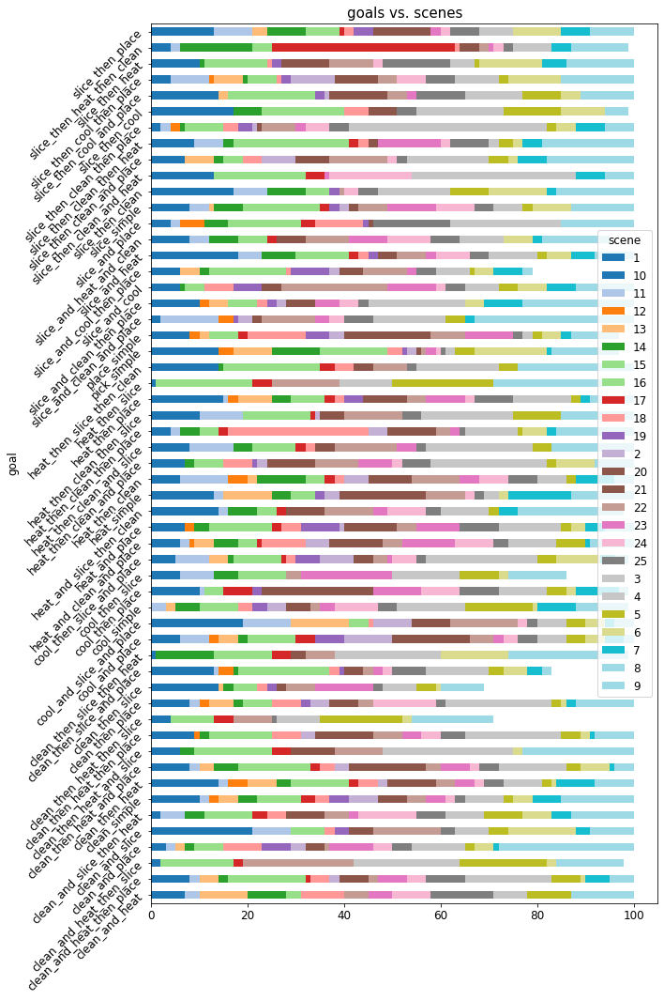

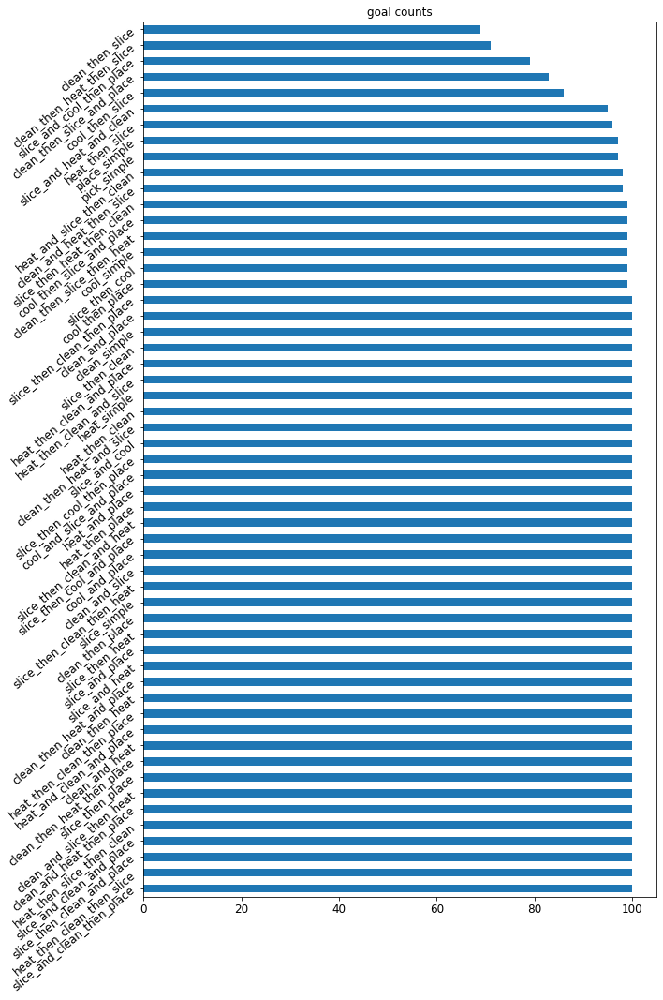

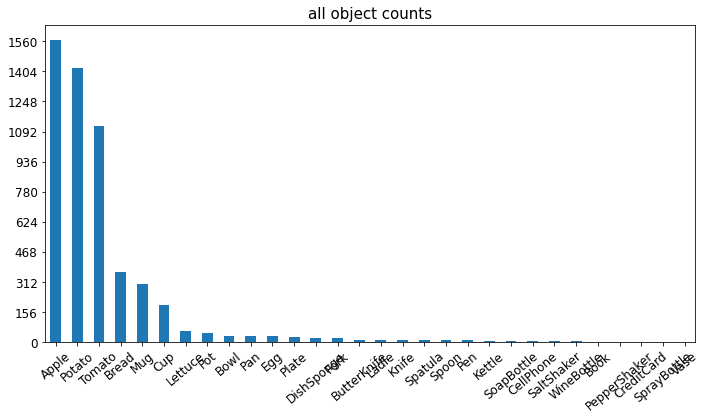

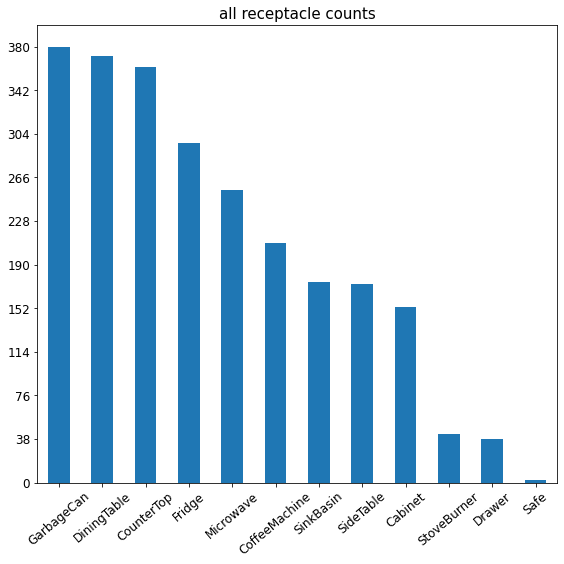

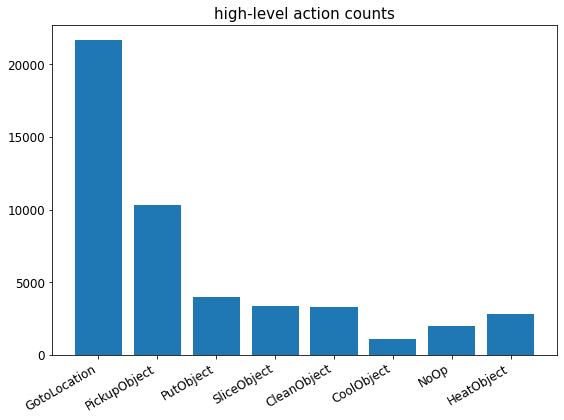

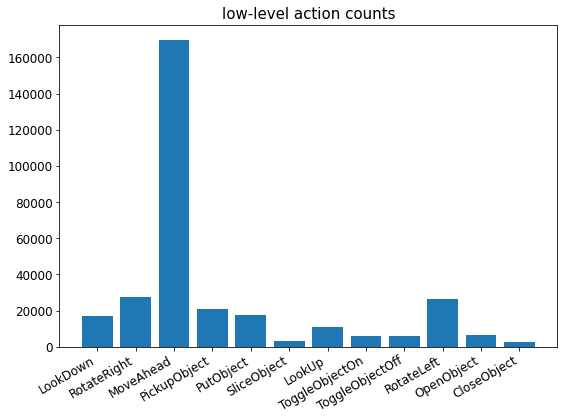

<Figure size 432x432 with 0 Axes>

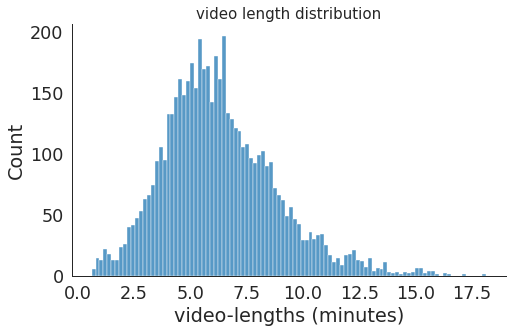

In [5]:
succ_traj = pd.DataFrame(columns=["goal", "pickup", "movable", "receptacle", "scene"])
save_path = os.path.join(os.environ['DATA_ROOT'], 'train')
succ_traj, _, high_action_count, low_action_count, vid_lens_train, complexity_train, ordering_train = load_successes_from_disk(save_path, succ_traj, False, 1)
len(succ_traj) #5363  😎
plot_dataset_stats(succ_traj, (high_action_count, low_action_count), vid_lens_train)

# Analyzing Test Splits

## 1. Sub-goal Composition

<Figure size 2160x2160 with 0 Axes>

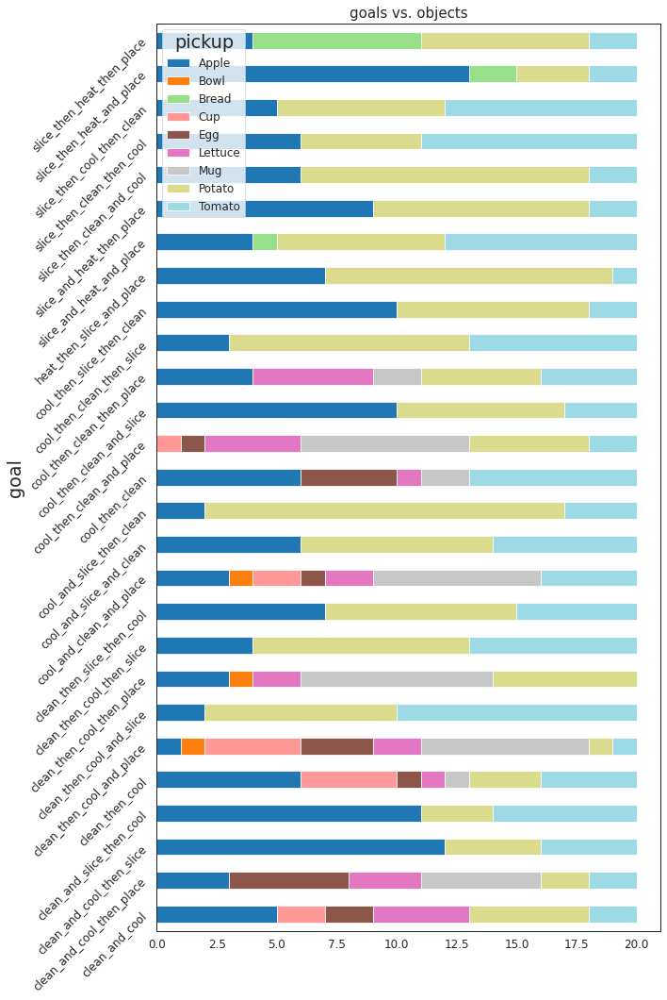

no movable objects used


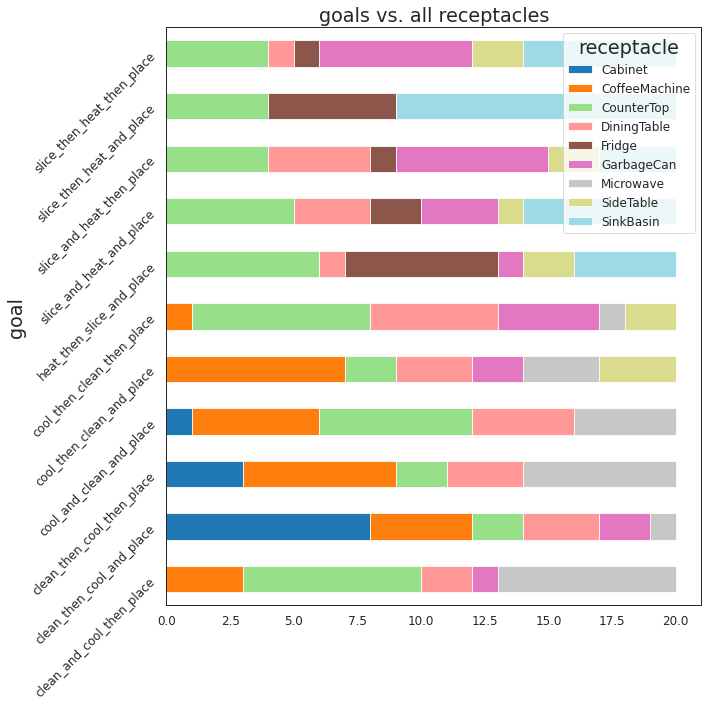

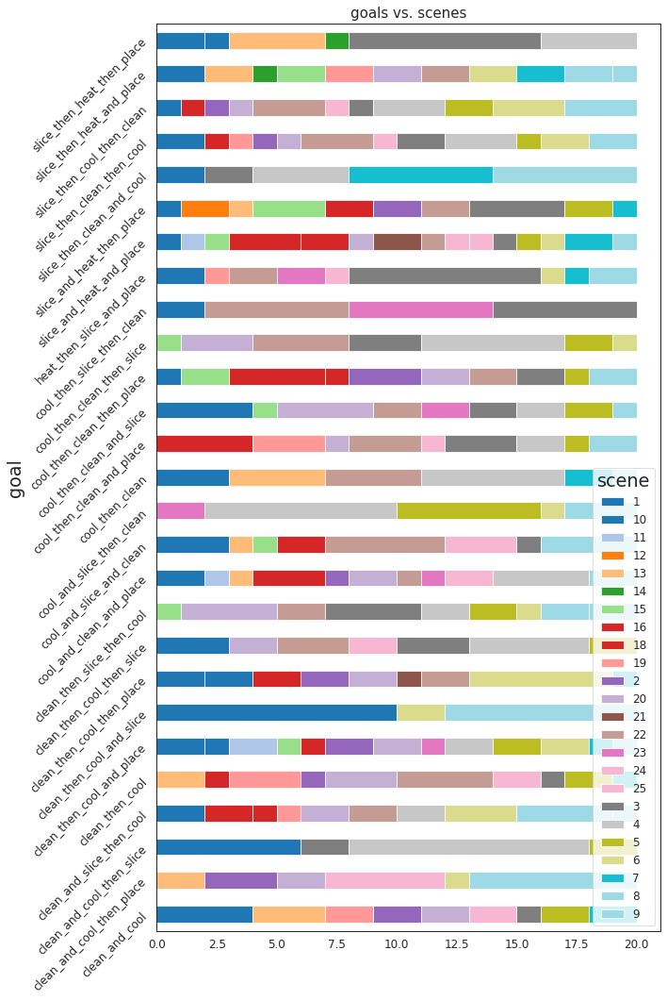

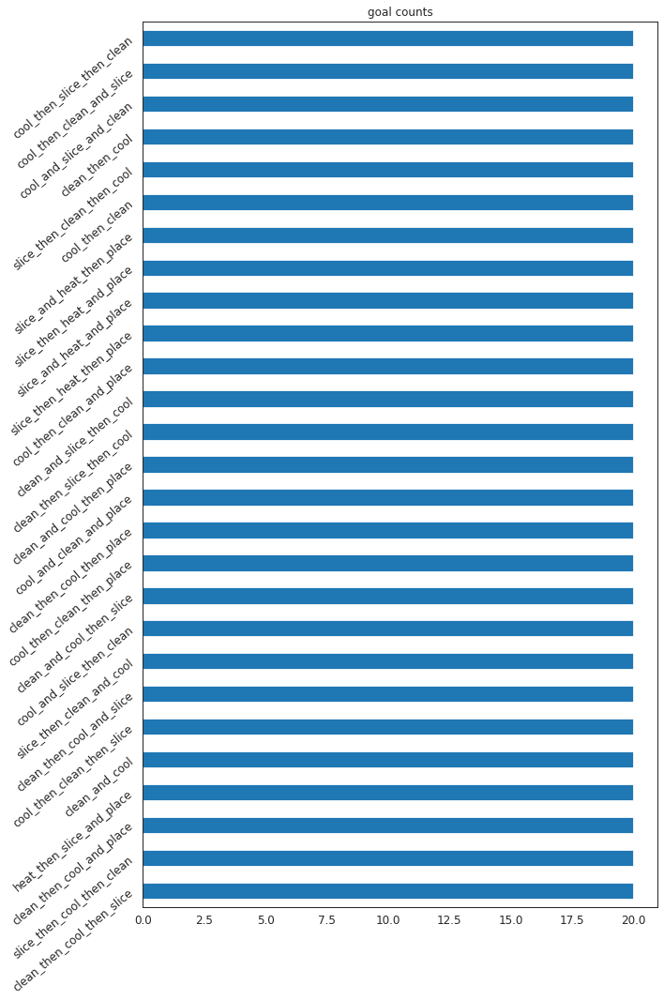

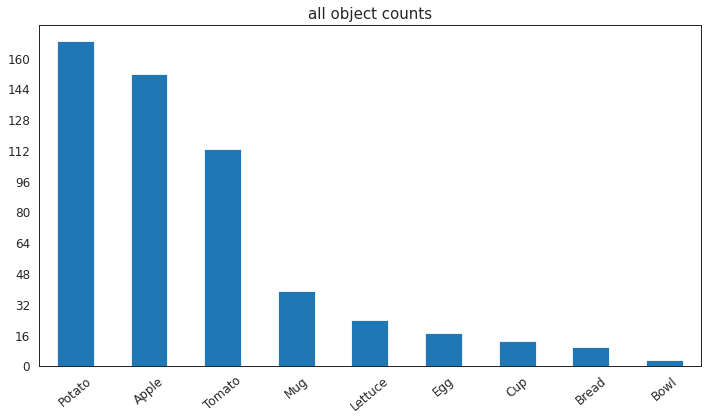

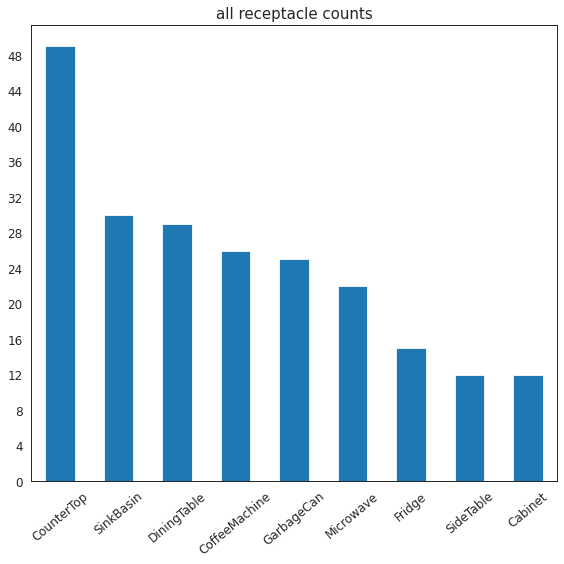

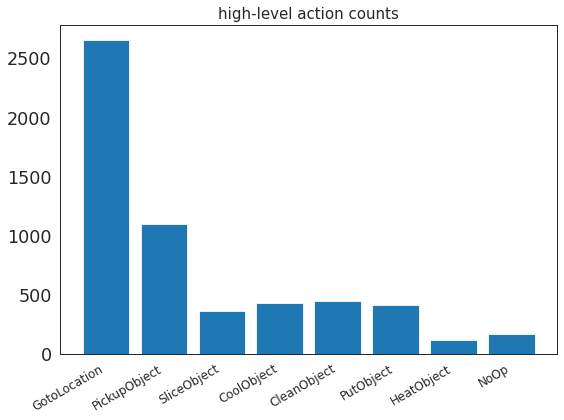

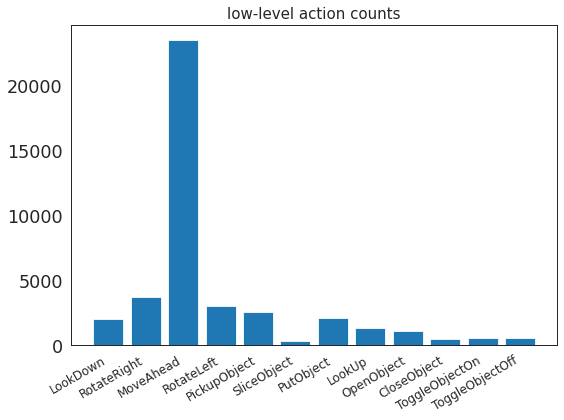

<Figure size 432x432 with 0 Axes>

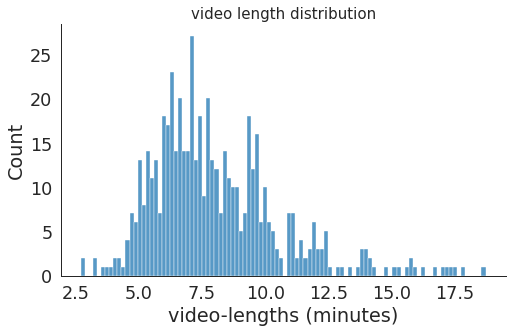

In [6]:
succ_traj = pd.DataFrame(columns=["goal", "pickup", "movable", "receptacle", "scene"])
save_path = os.path.join(os.environ['DATA_ROOT'], 'test_splits/sub_goal_composition')
succ_traj, _, high_action_count, low_action_count, vid_lens_sub_goal, complexity_sub_goal, ordering_sub_goal = load_successes_from_disk(save_path, succ_traj, False, 1)
# high_action_count, low_action_count, vid_lens_sub_goal = analyze_trajectories(save_path)
len(succ_traj)  # 😎 540
plot_dataset_stats(succ_traj, (high_action_count, low_action_count), vid_lens_sub_goal)

## 2. Verb-noun composition

<Figure size 2160x2160 with 0 Axes>

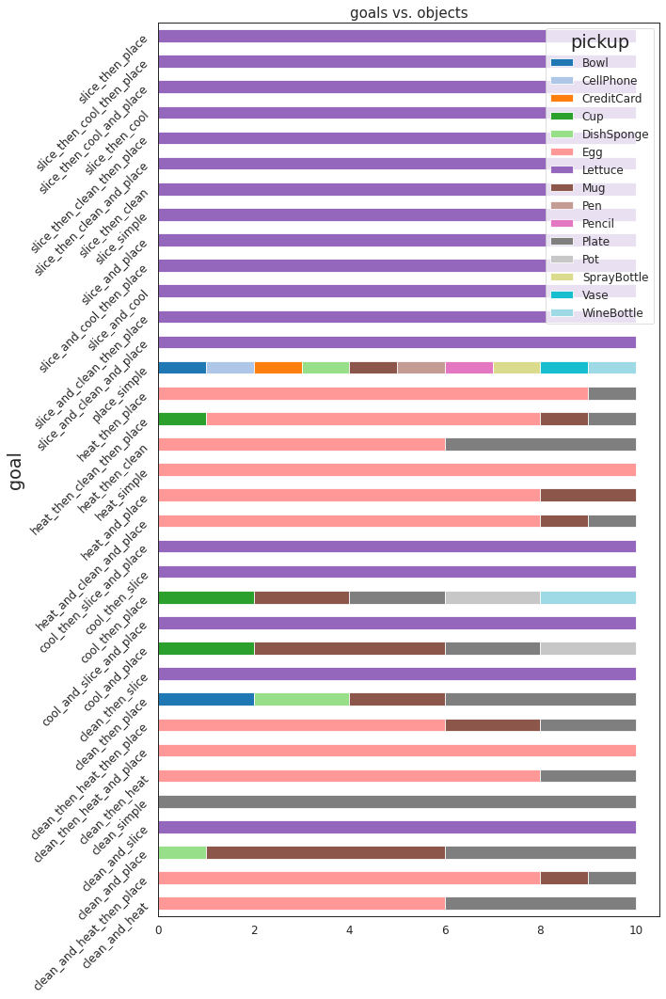

no movable objects used


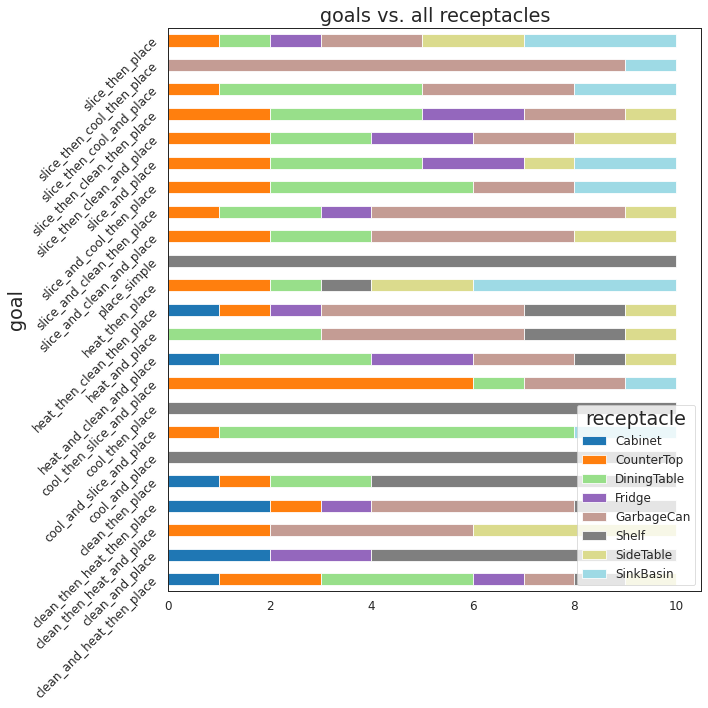

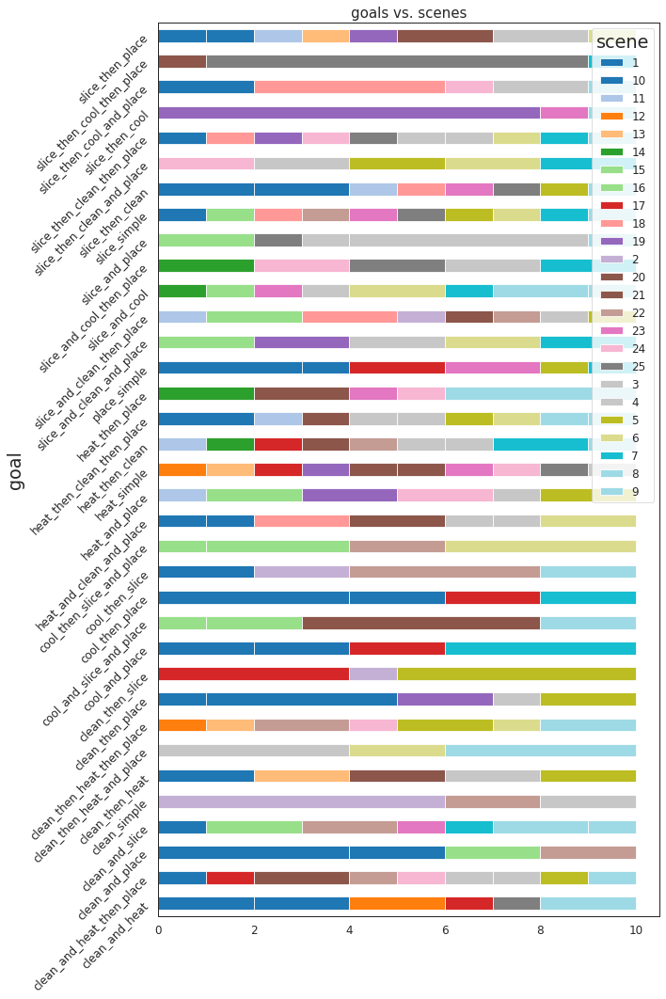

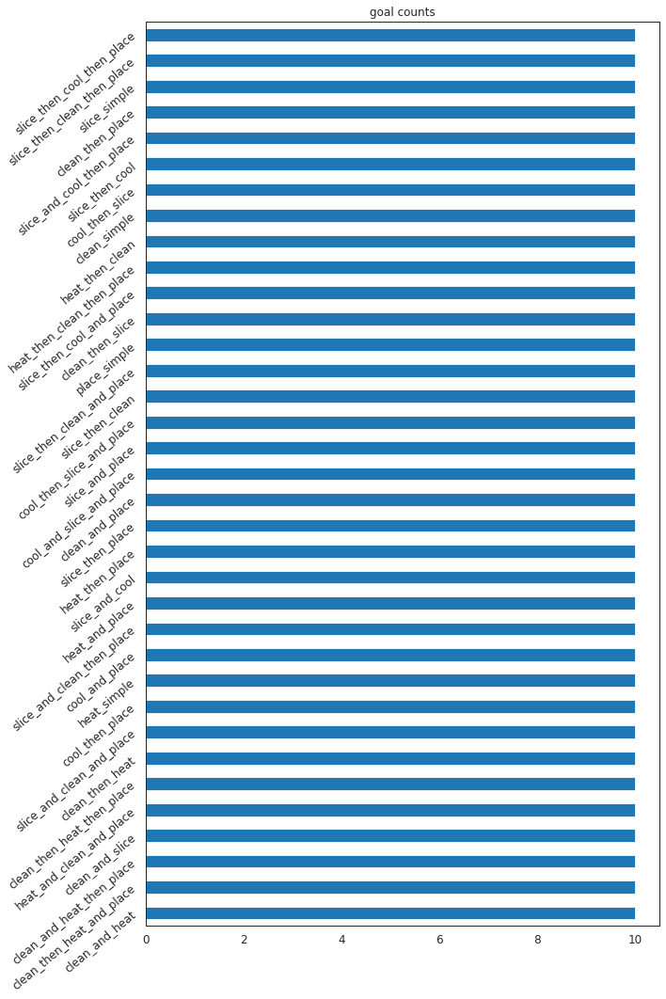

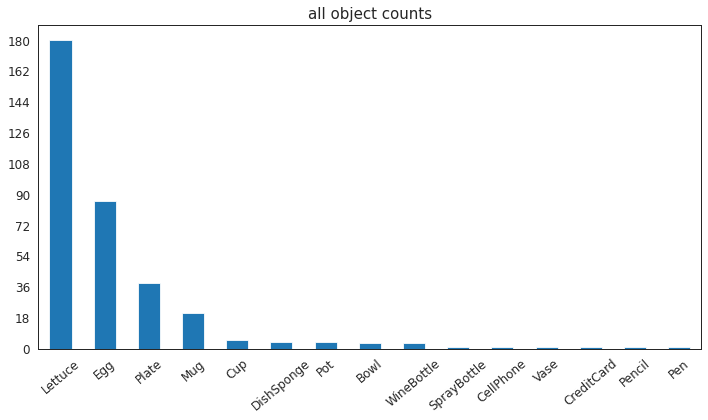

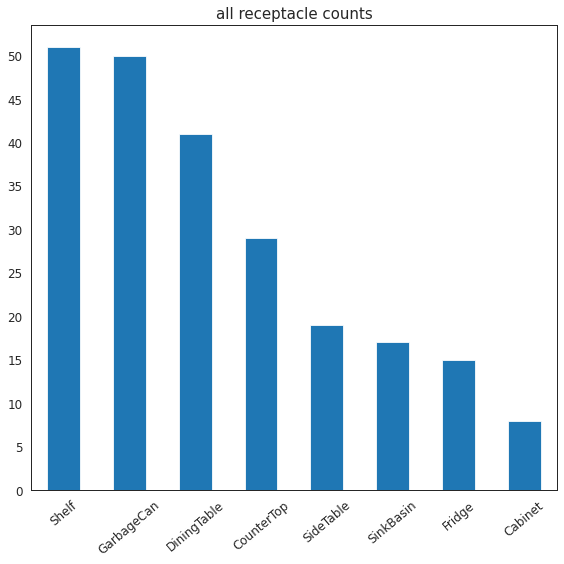

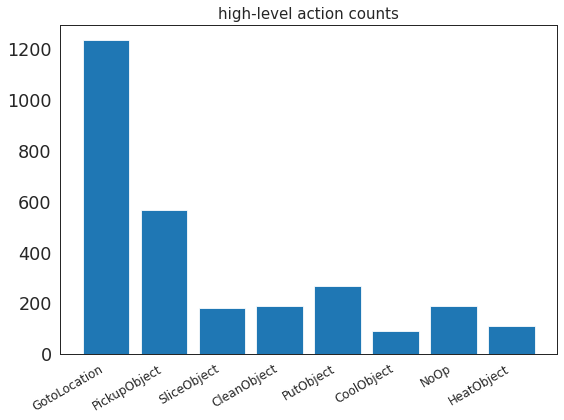

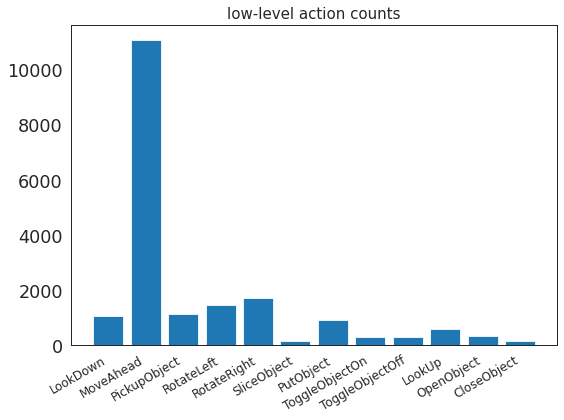

<Figure size 432x432 with 0 Axes>

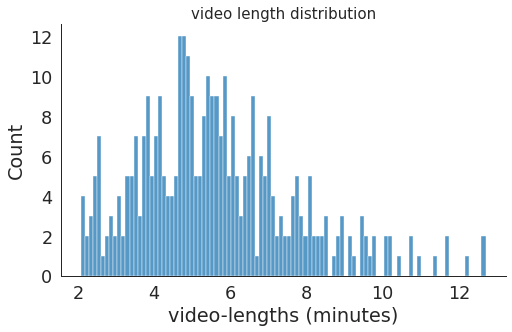

In [7]:
succ_traj = pd.DataFrame(columns=["goal", "pickup", "movable", "receptacle", "scene"])
save_path = os.path.join(os.environ['DATA_ROOT'], 'test_splits/verb_noun_composition')
succ_traj, _, high_action_count, low_action_count, vid_lens_verb_noun, complexity_verb_noun, ordering_verb_noun = load_successes_from_disk(save_path, succ_traj, False, 1)
# high_action_count, low_action_count, vid_lens_verb_noun = analyze_trajectories(save_path)
len(succ_traj) # 350 😎
plot_dataset_stats(succ_traj, (high_action_count, low_action_count), vid_lens_verb_noun)

## 3. Context-verb-noun Composition

<Figure size 2160x2160 with 0 Axes>

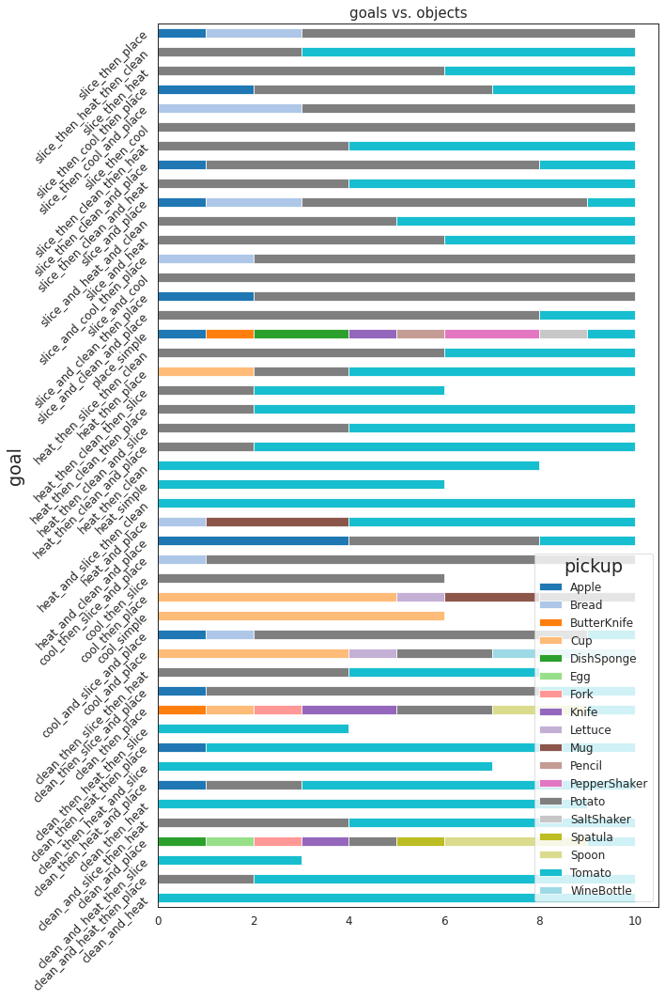

no movable objects used


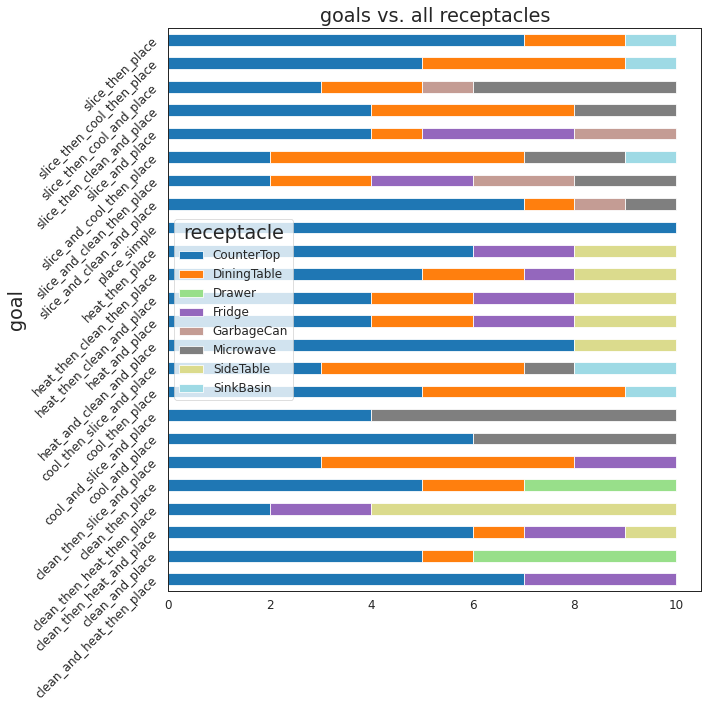

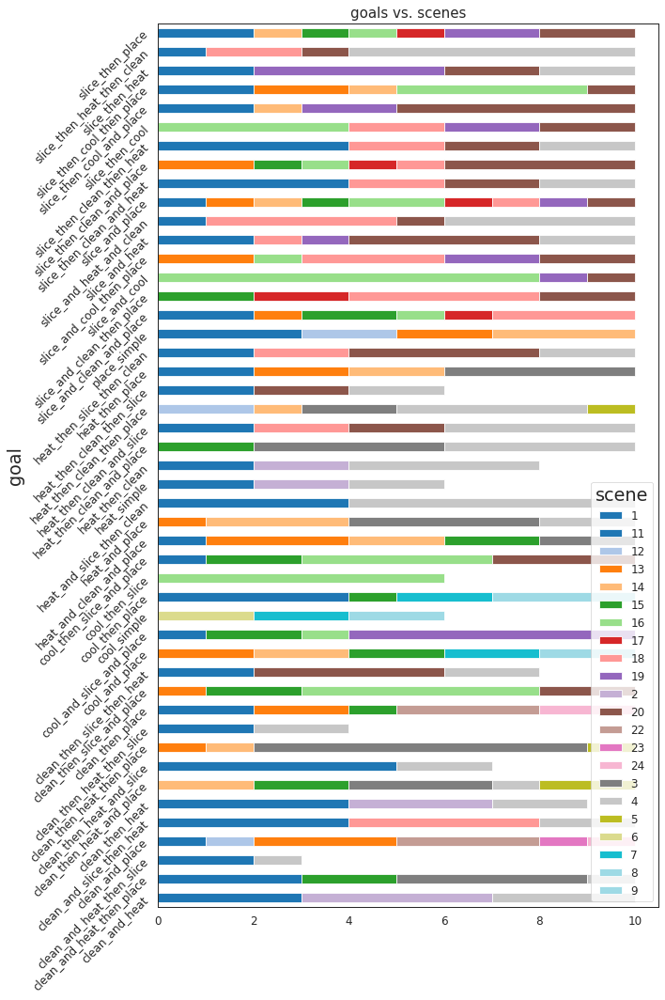

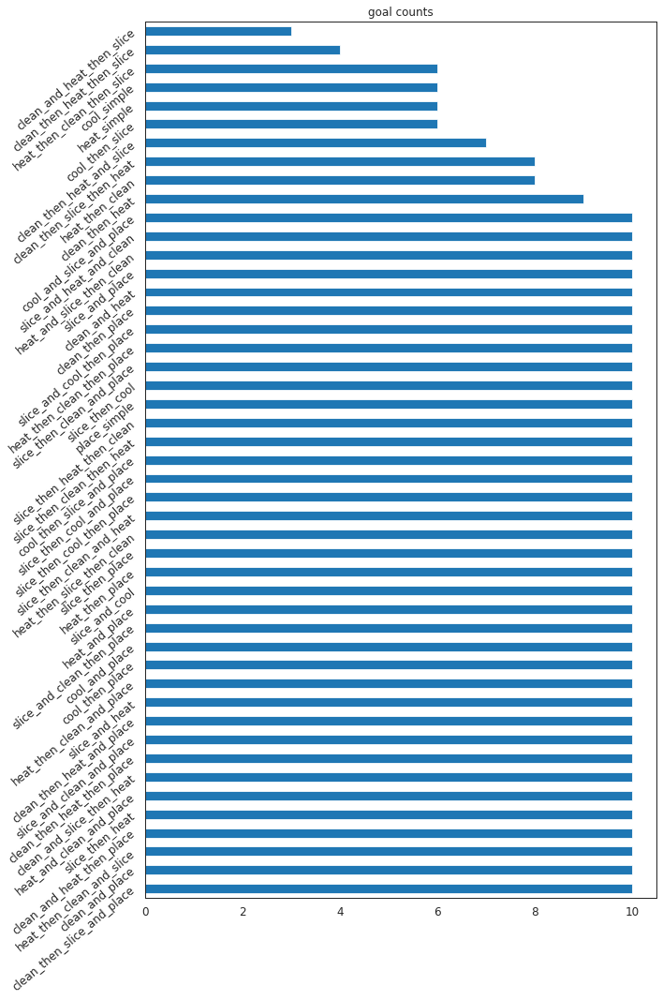

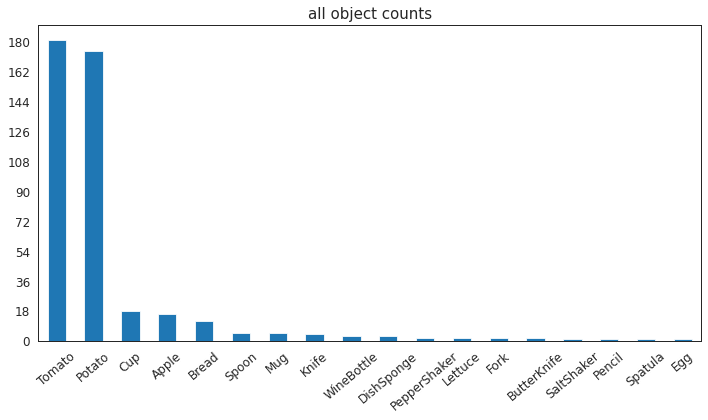

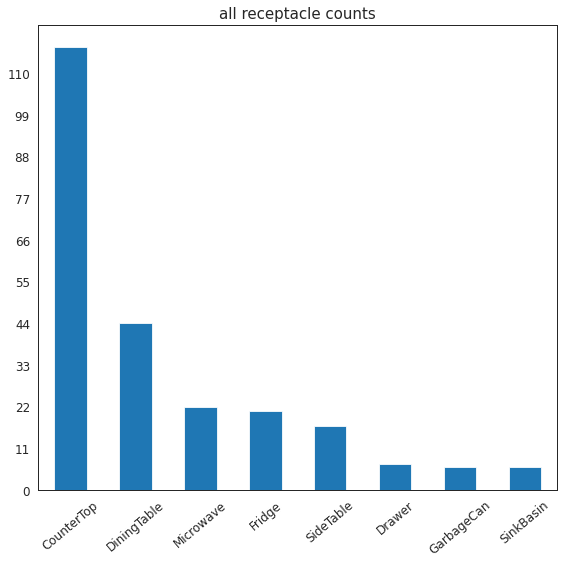

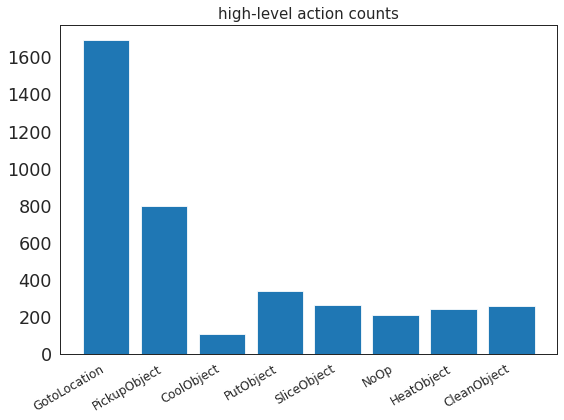

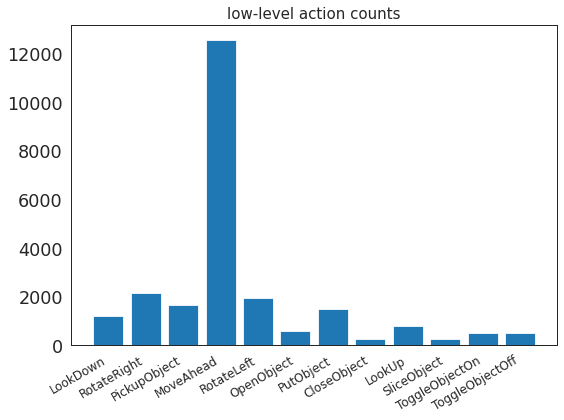

<Figure size 432x432 with 0 Axes>

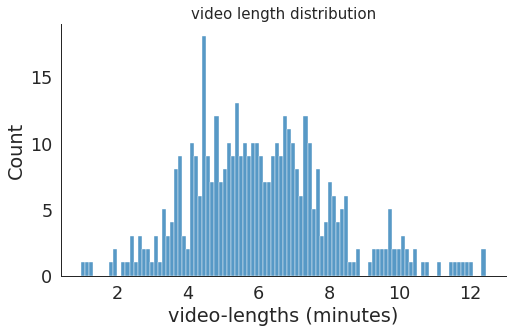

In [8]:
succ_traj = pd.DataFrame(columns=["goal", "pickup", "movable", "receptacle", "scene"])
save_path = os.path.join(os.environ['DATA_ROOT'], 'test_splits/context_verb_noun_composition')
succ_traj, _, high_action_count, low_action_count, vid_lens_context_verb_noun, complexity_context_verb_noun, ordering_context_verb_noun = load_successes_from_disk(save_path, succ_traj, False, 1)
# high_action_count, low_action_count, vid_lens_context_verb_noun = analyze_trajectories(save_path)
len(succ_traj)  # 433
plot_dataset_stats(succ_traj, (high_action_count, low_action_count), vid_lens_context_verb_noun)

## 4. Context-goal Composition

<Figure size 2160x2160 with 0 Axes>

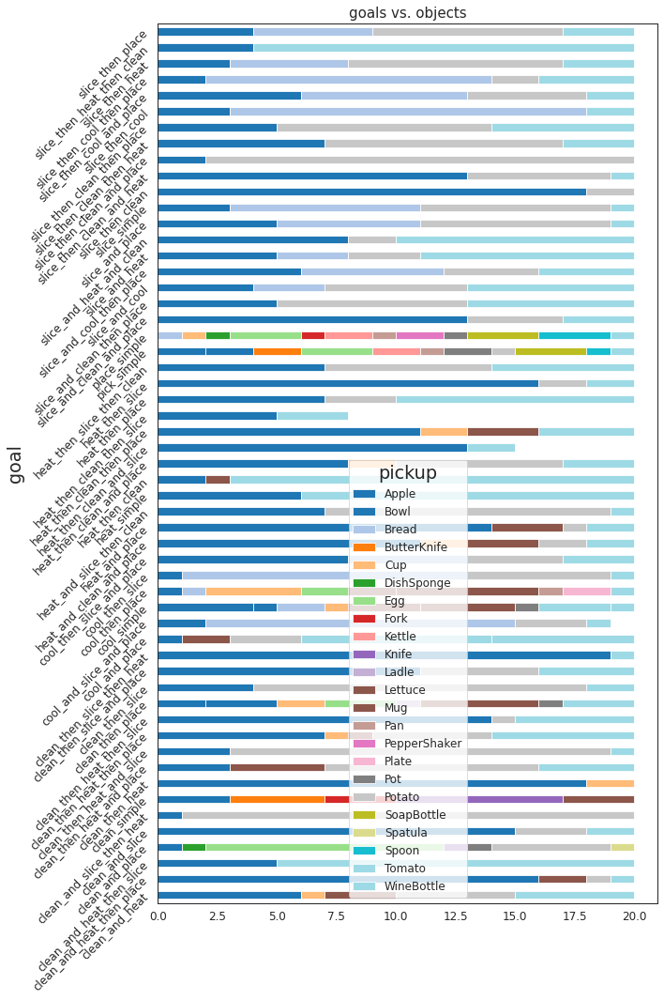

no movable objects used


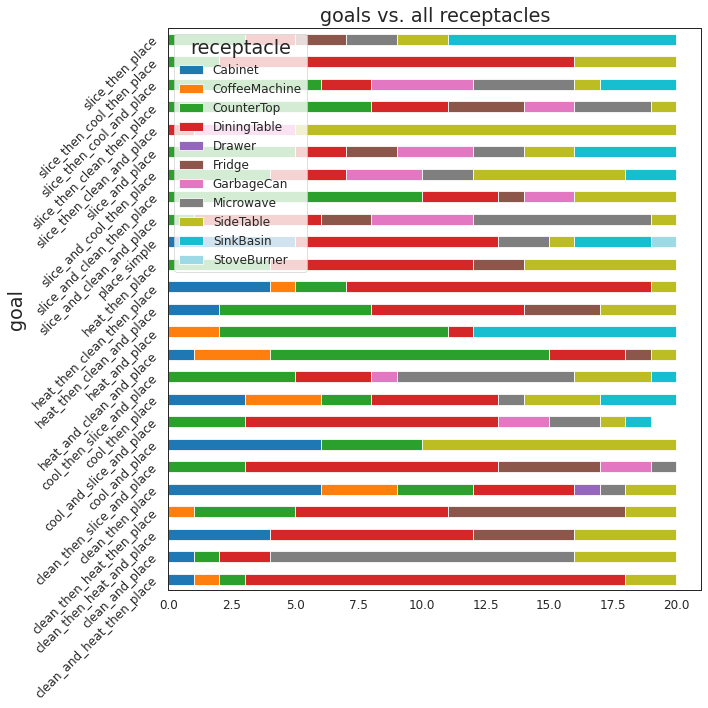

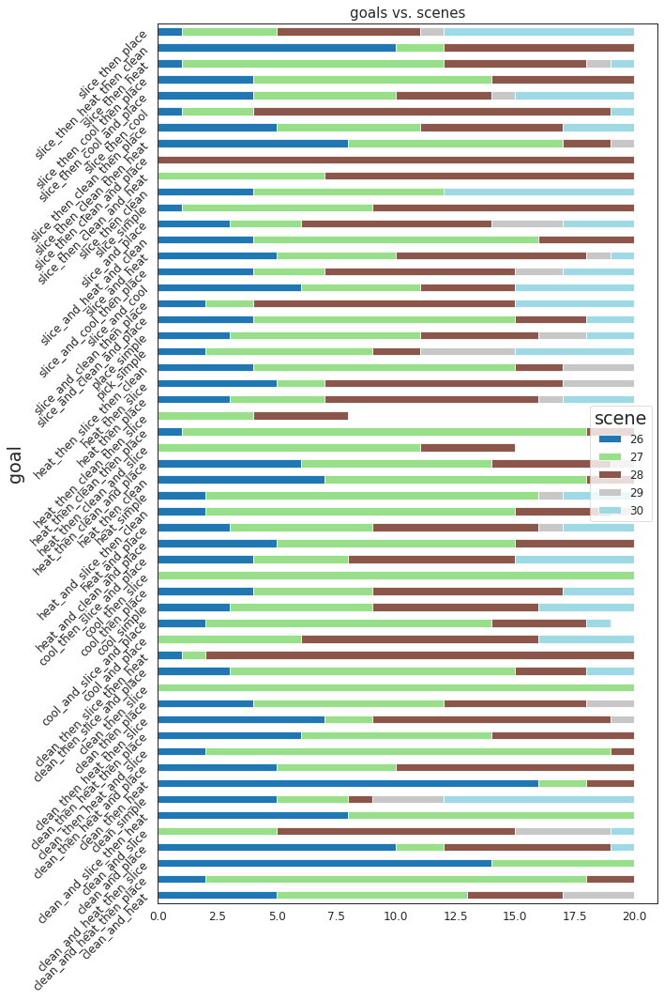

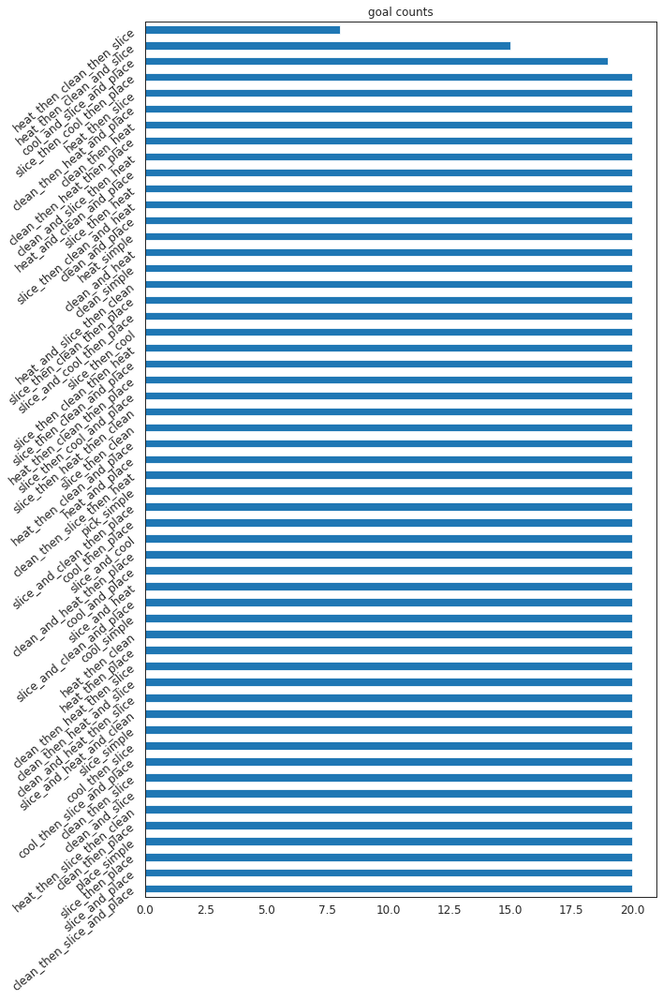

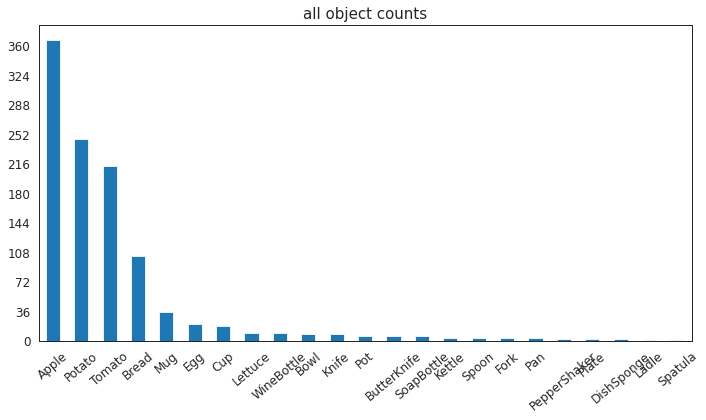

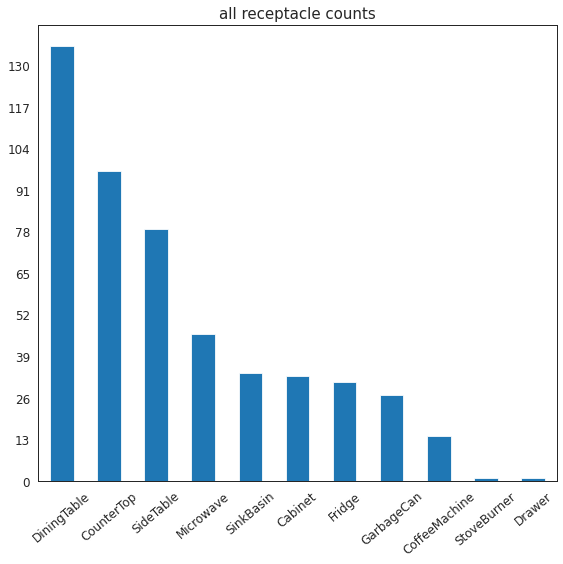

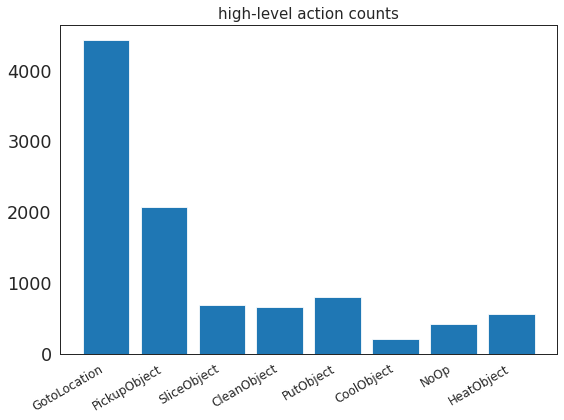

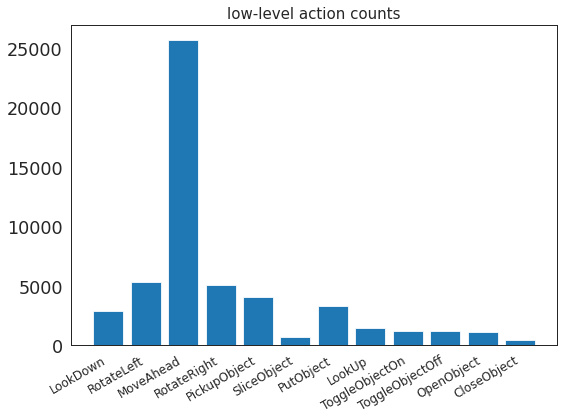

<Figure size 432x432 with 0 Axes>

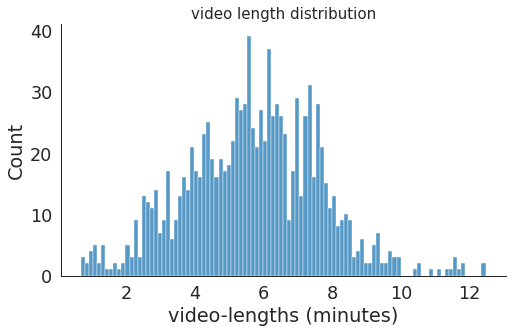

In [9]:
succ_traj = pd.DataFrame(columns=["goal", "pickup", "movable", "receptacle", "scene"])
save_path = os.path.join(os.environ['DATA_ROOT'], 'test_splits/context_goal_composition')
succ_traj, _, high_action_count, low_action_count, vid_lens_context_goal, complexity_context_goal, ordering_context_goal = load_successes_from_disk(save_path, succ_traj, False, 1)
# high_action_count, low_action_count, vid_lens_context_goal = analyze_trajectories(save_path)
len(succ_traj)  # 1082
plot_dataset_stats(succ_traj, (high_action_count, low_action_count), vid_lens_context_goal)

## 5. Abstraction

<Figure size 2160x2160 with 0 Axes>

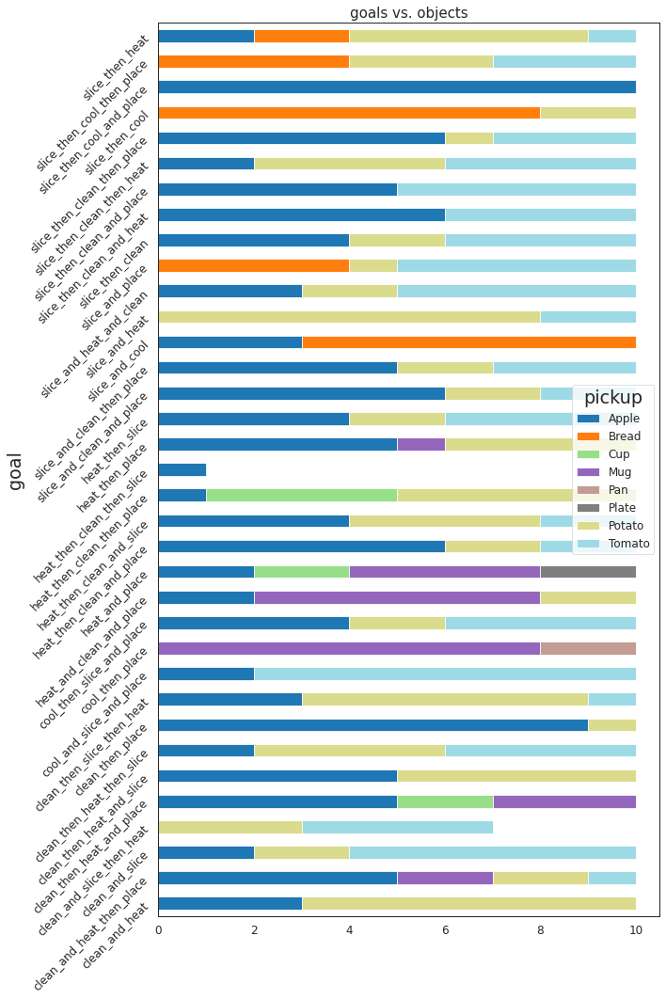

no movable objects used


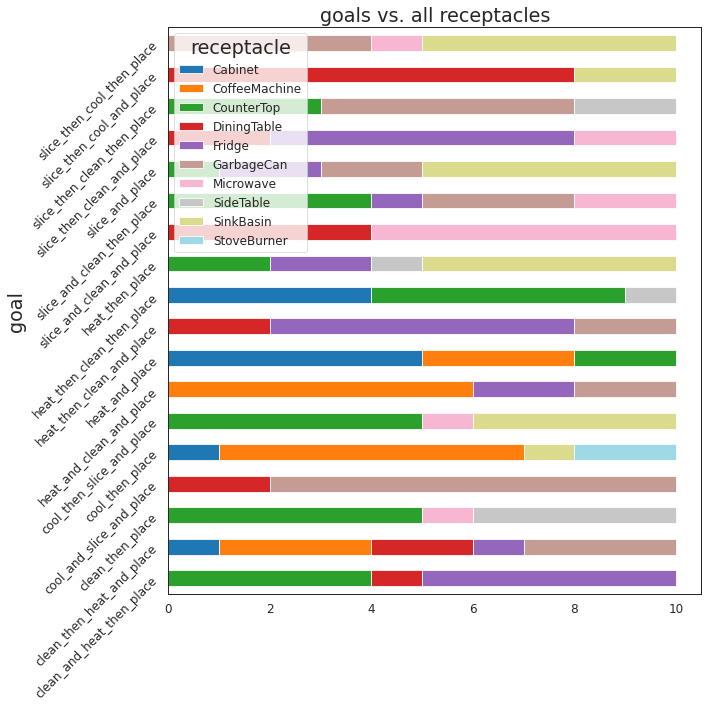

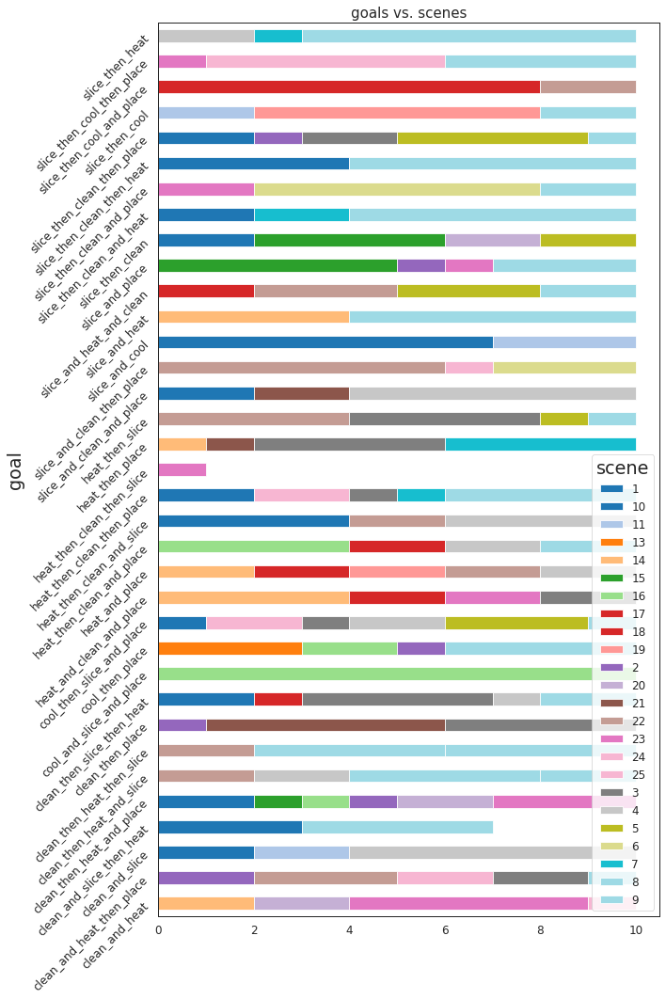

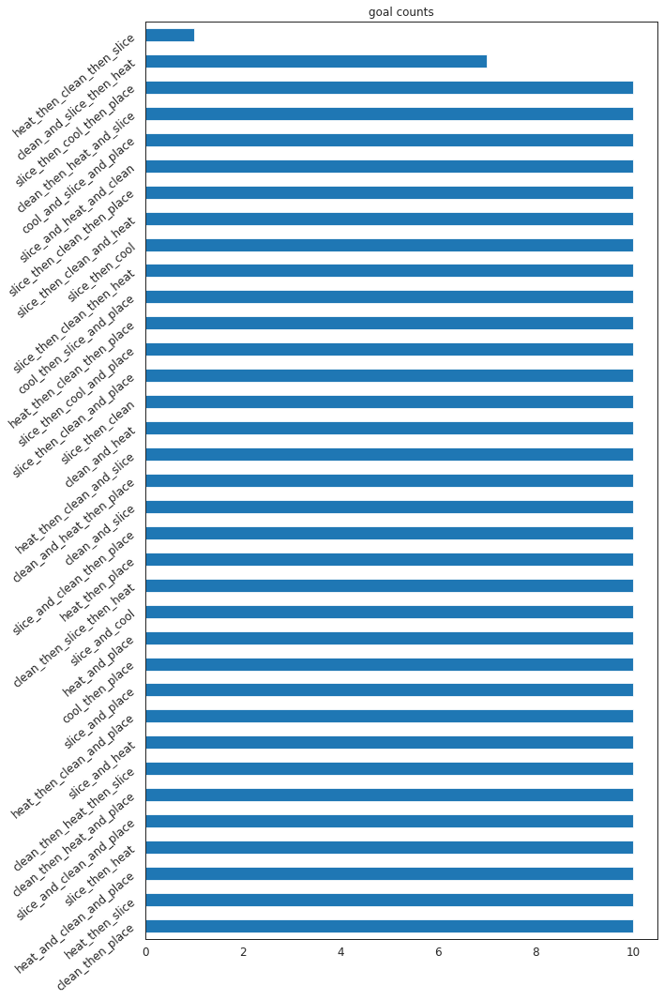

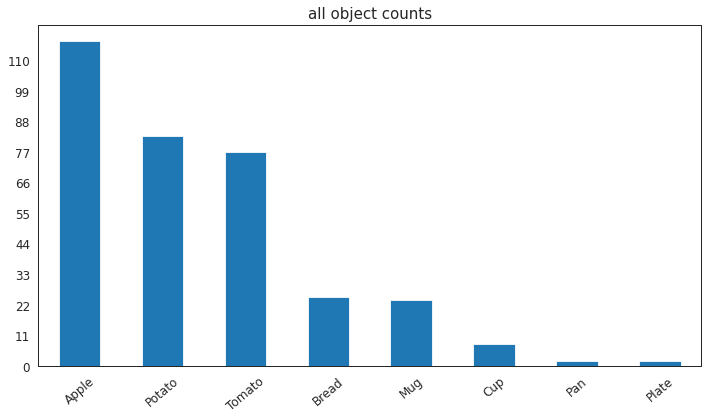

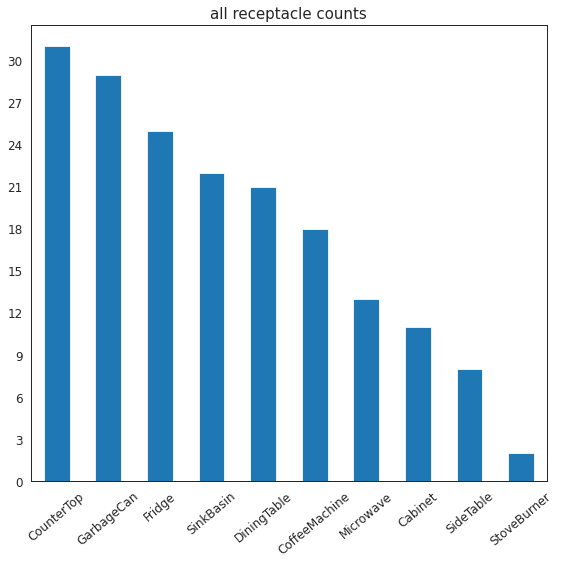

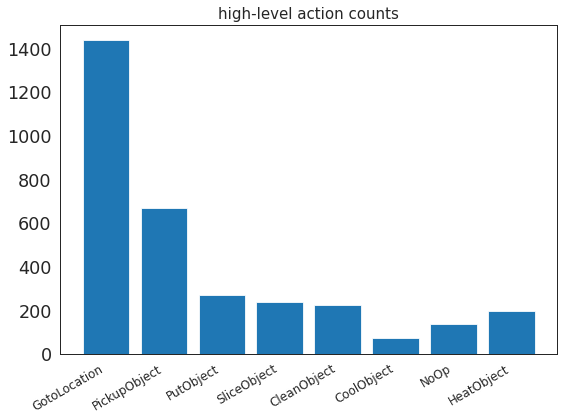

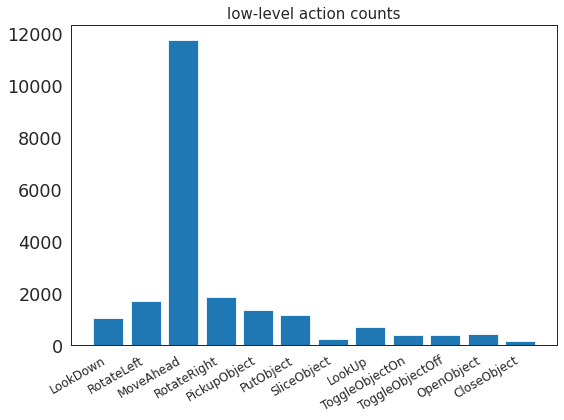

<Figure size 432x432 with 0 Axes>

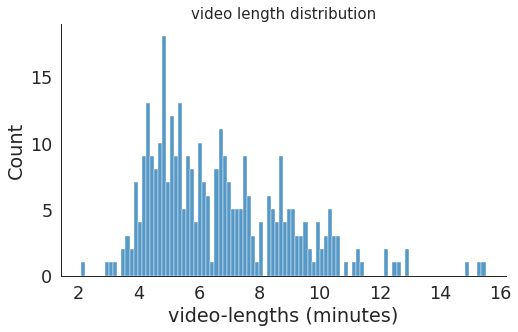

In [23]:
succ_traj = pd.DataFrame(columns=["goal", "pickup", "movable", "receptacle", "scene"])
save_path = os.path.join(os.environ['DATA_ROOT'], 'test_splits/abstraction')
succ_traj, _, high_action_count, low_action_count, vid_lens_abstraction, complexity_abstraction, ordering_abstraction = load_successes_from_disk(save_path, succ_traj, False, 1)
# high_action_count, low_action_count, vid_lens_abstraction = analyze_trajectories(save_path)
len(succ_traj)  # 338
plot_dataset_stats(succ_traj, (high_action_count, low_action_count), vid_lens_abstraction)

# Dataset Hours

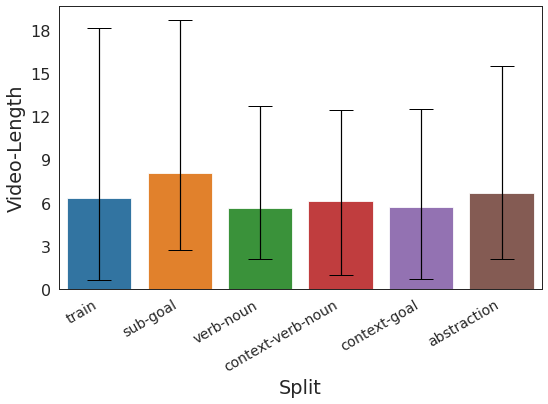

In [73]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.rcParams['errorbar.capsize'] = 12

Split = ['train', 'sub-goal', 'verb-noun', 'context-verb-noun', 'context-goal', 'abstraction']
    
def plot_err_plot(train, sub_goal, verb_noun, context_verb_noun, context_goal, abstraction, measure):
    _mean = [np.array(train).mean(), np.array(sub_goal).mean(), 
             np.array(verb_noun).mean(), np.array(context_verb_noun).mean(), 
             np.array(context_goal).mean(), np.array(abstraction).mean()]
    _min = [np.array(train).min(), np.array(sub_goal).min(), 
             np.array(verb_noun).min(), np.array(context_verb_noun).min(), 
             np.array(context_goal).min(), np.array(abstraction).min()]
    _max = [np.array(train).max(), np.array(sub_goal).max(), 
             np.array(verb_noun).max(), np.array(context_verb_noun).max(), 
             np.array(context_goal).max(), np.array(abstraction).max()]
    df = pd.DataFrame({'Split':Split, measure:_mean, 'Min': _min, 'Max': _max})

    # create ymin and ymax
    df['ymin'] = df[measure] - df.Min
    df['ymax'] = df.Max - df[measure]

    # extract ymin and ymax into a (2, N) array as required by the yerr parameter
    yerr = df[['ymin', 'ymax']].T.to_numpy()

    # plot with error bars
    sns.barplot(x='Split', y=measure, data=df, yerr=yerr, ax=ax)
    max_val = np.array(_max).max()
    plt.yticks(np.arange(0, max_val + 1, 3), fontsize=16)
    plt.xticks(rotation=30, ha='right', fontsize=14)
    
plot_err_plot(vid_lens_train, vid_lens_sub_goal, vid_lens_verb_noun, vid_lens_context_verb_noun, vid_lens_context_goal, vid_lens_abstraction, measure='Video-Length')
plt.tight_layout()
plt.show()
plt.close()

In [25]:
test_hours = np.array(vid_lens_sub_goal).sum() + np.array(vid_lens_verb_noun).sum() \
+ np.array(vid_lens_context_verb_noun).sum() + np.array(vid_lens_context_goal).sum() + np.array(vid_lens_abstraction).sum()
test_hours = round(test_hours/60, 3)
train_hours = round(np.array(vid_lens_train).sum()/60, 3)
print('Total Hours: {}h | Train: {}h | Test: {}h'.format(test_hours+train_hours, train_hours, test_hours))

Total Hours: 852.048h | Train: 562.665h | Test: 289.383h


## Complexity and Ordering comparison

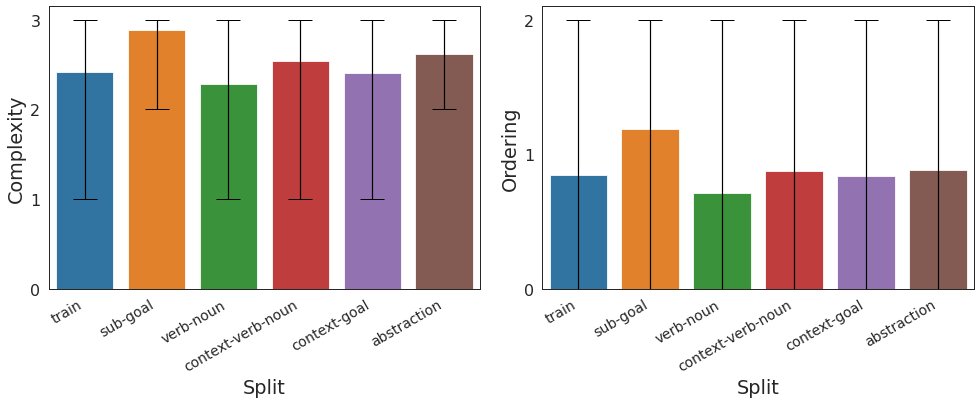

In [71]:
# complexity = number of sub-goals
# ordering = number of ordering constraints
plt.figure(figsize=(14, 6))
def plot_err_plot(train, sub_goal, verb_noun, context_verb_noun, context_goal, abstraction, measure, ind):
    _mean = [np.array(train).mean(), np.array(sub_goal).mean(), 
             np.array(verb_noun).mean(), np.array(context_verb_noun).mean(), 
             np.array(context_goal).mean(), np.array(abstraction).mean()]
    _min = [np.array(train).min(), np.array(sub_goal).min(), 
             np.array(verb_noun).min(), np.array(context_verb_noun).min(), 
             np.array(context_goal).min(), np.array(abstraction).min()]
    _max = [np.array(train).max(), np.array(sub_goal).max(), 
             np.array(verb_noun).max(), np.array(context_verb_noun).max(), 
             np.array(context_goal).max(), np.array(abstraction).max()]
    df = pd.DataFrame({'Split':Split, measure:_mean, 'Min': _min, 'Max': _max})

    # create ymin and ymax
    df['ymin'] = df[measure] - df.Min
    df['ymax'] = df.Max - df[measure]

    # extract ymin and ymax into a (2, N) array as required by the yerr parameter
    yerr = df[['ymin', 'ymax']].T.to_numpy()

    # plot with error bars
    plt.subplot(1,2,ind)
    sns.barplot(x='Split', y=measure, data=df, yerr=yerr)
    max_val = np.array(_max).max()
    plt.yticks(np.arange(0, max_val + 1, 1), fontsize=16)
    plt.xticks(rotation=30, ha='right', fontsize=14)

plot_err_plot(complexity_train, complexity_sub_goal, complexity_verb_noun, complexity_context_verb_noun, complexity_context_goal, complexity_abstraction, measure='Complexity', ind=1)
plot_err_plot(ordering_train, ordering_sub_goal, ordering_verb_noun, ordering_context_verb_noun, ordering_context_goal, ordering_abstraction, measure='Ordering', ind=2)
plt.tight_layout()
plt.show()